# Домашнее задание №13. Введение в OpenCV

In [34]:
import matplotlib.pyplot as plt
import cv2
import numpy as np

## Задание 1
Выбрать изображение не менее 1000х800 пикселей (px). Получить копии этого изображения с цветовыми моделями YUV, HSV. Полученные изображения перевести обратно в BGR. Изменить значения каждого из параметров цветовых моделей YUV, HSV, сделать выводы о влиянии этих параметров.

#### Теория:
BGR — стандартное цветовое пространство OpenCV (используется по умолчанию). Является аналогом RGB пространства, но с другим порядком компонентов.

RGB — в данном методе отображения цвета мы раскладываем каждый пиксель на составляющие в виде красной (red), зеленой (green) и голубой (blue) компоненты. 

HSV — это отображение создано для упрощения представление цвета человеком. Люди в случае описания цвета редко пользуются компонентами цвета, обычно они применяют такие слова как оттенок (hue), насыщенность (saturation) и интенсивность (value) цвета. 

GRAY — черно-белое пространство, где яркость рассчитывается как средняя яркость всех трех компонент модели BGR. 

YUV — данная схема пришла из телевидения, где компонента Y – значение яркости, а UV – двух цветоразностных сигналов.

In [35]:
nature = cv2.imread('img.jpg')                               # BGR

natureRGB = cv2.cvtColor(nature, cv2.COLOR_BGR2RGB)          # RGB

hsv = cv2.cvtColor(nature, cv2.COLOR_BGR2HSV)                # HSV

hsv_converted_back = cv2.cvtColor(hsv, cv2.COLOR_HSV2BGR)    # HSV -> BGR

img_yuv = cv2.cvtColor(nature, cv2.COLOR_BGR2YUV)            # YUV

img_output = cv2.cvtColor(img_yuv, cv2.COLOR_YUV2BGR)        # YUV -> BGR

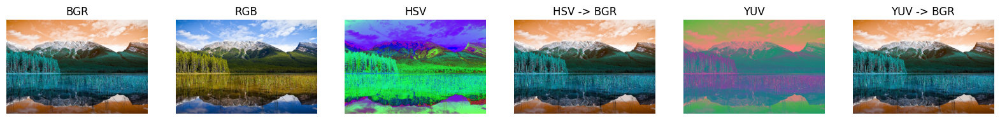

In [36]:
images = [nature, natureRGB, hsv, hsv_converted_back, img_yuv, img_output]
titles = ['BGR', 'RGB', 'HSV', 'HSV -> BGR', 'YUV', 'YUV -> BGR']

plt.figure(figsize=(20, 5))
for i, (img, title) in enumerate(zip(images, titles), start=1):
    plt.subplot(1, len(images), i)
    plt.imshow(img)
    plt.title(title)
    plt.axis('off')

plt.show()

Изменение параметров

In [37]:
# HSV: Изменение Hue (оттенок), Saturation (насыщенность), Value (яркость)
h, s, v = cv2.split(hsv)

h_modified = h + 100  # Оттенок
s_modified = s + 100  # Увеличение насыщенности
v_modified = v + 100  # Увеличение яркости

hsv_modified_h = cv2.merge([h_modified, s, v])
hsv_modified_s = cv2.merge([h, s_modified, v])
hsv_modified_v = cv2.merge([h, s, v_modified])

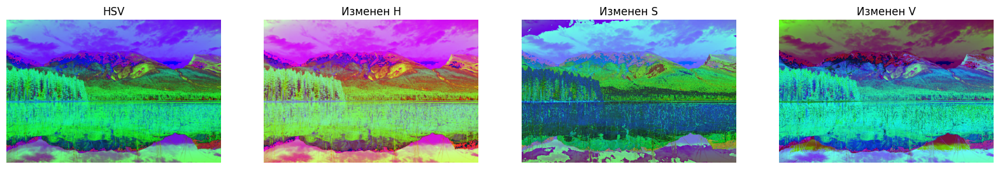

In [38]:
images = [hsv, hsv_modified_h, hsv_modified_s, hsv_modified_v]
titles = ['HSV', 'Изменен H', 'Изменен S', 'Изменен V']

plt.figure(figsize=(20, 5))
for i, (img, title) in enumerate(zip(images, titles), start=1):
    plt.subplot(1, len(images), i)
    plt.imshow(img)
    plt.title(title)
    plt.axis('off')

plt.show()

In [39]:
# YUV: Изменение Y (яркость), U (цветность), V (цветность)
y, u, v2 = cv2.split(img_yuv)

y_modified = y + 100          # Увеличение яркости
u_modified = u + 100          # U
v_modified_yuv = v + 100      # V

yuv_modified_y = cv2.merge([y_modified, u, v2])
yuv_modified_u = cv2.merge([y, u_modified, v2])
yuv_modified_v = cv2.merge([y, u, v_modified_yuv])

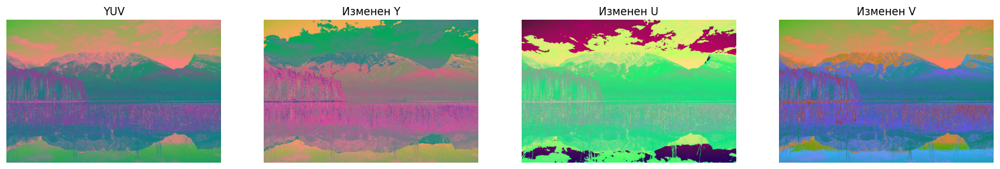

In [40]:
images = [img_yuv, yuv_modified_y, yuv_modified_u, yuv_modified_v]
titles = ['YUV', 'Изменен Y', 'Изменен U', 'Изменен V']

plt.figure(figsize=(20, 5))
for i, (img, title) in enumerate(zip(images, titles), start=1):
    plt.subplot(1, len(images), i)
    plt.imshow(img)
    plt.title(title)
    plt.axis('off')

plt.show()

# Задание №2

На выбранном вами изображении с текстом подобрать ядро преобразования, такое что после размытия видно, что текст есть, но прочитать его уже невозможно.

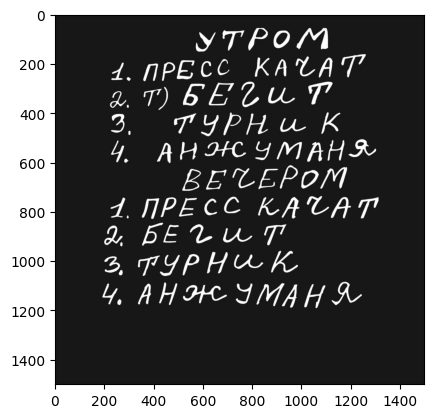

In [41]:
task2 = cv2.imread('task2.jpg') 
plt.imshow(task2)

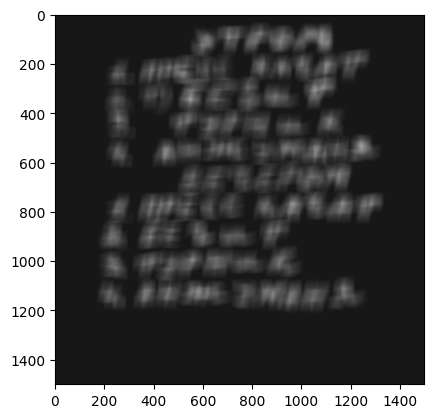

In [42]:
# ядро 51x51
blurred = cv2.blur(task2, (51, 51))
plt.imshow(blurred)

# Задание №3

Применить фильтры Собеля, Лапласа, алгоритм Канни для выделения границ фигур на выбранном grayscale изображении.

### Теория:
Фильтр Собеля детектирует границы по горизонтали (вертикальные линии) и по вертикали (горизонтальные линии).

Фильтр Лапласа: в результате обработки области с постоянной или линейно возрастающей интенсивностью становятся черными, а области быстро изменяющихся значений интенсивности ярко высвечиваются.

Детектор границ Канни (Canny) выявляет горизонтальные, вертикальные и диагональные границы.

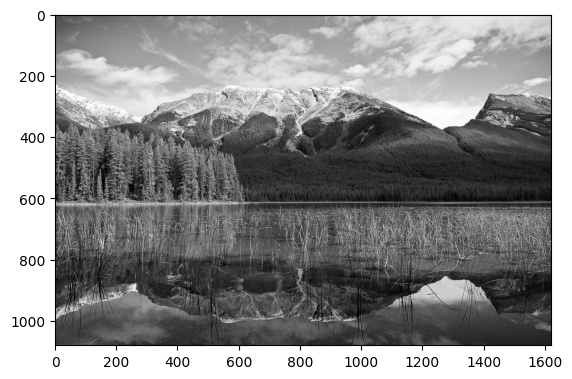

In [43]:
gray_fig = cv2.cvtColor(nature, cv2.COLOR_BGR2GRAY)
plt.imshow(cv2.cvtColor(gray_fig, cv2.COLOR_BGR2RGB))

Фильтр Собеля

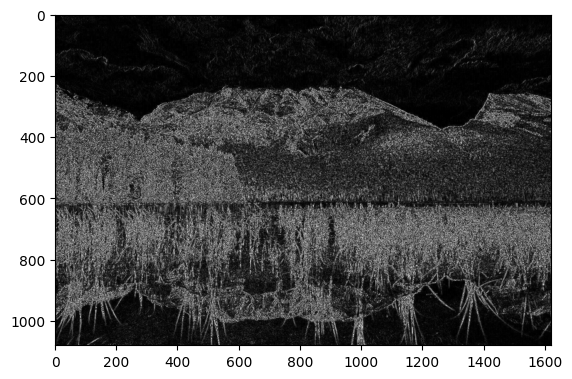

In [44]:
sobelx64f = cv2.Sobel(gray_fig,cv2.CV_64F,1,0,ksize=3)
abs_sobel64f = np.absolute(sobelx64f)
sobel_horizontal = np.uint8(abs_sobel64f)

sobelx64f_1 = cv2.Sobel(gray_fig,cv2.CV_64F,0,1,ksize=3)
abs_sobel64f_1 = np.absolute(sobelx64f_1)
sobel_vertical = np.uint8(abs_sobel64f_1)

plt.imshow(cv2.cvtColor(sobel_horizontal, cv2.COLOR_BGR2RGB))

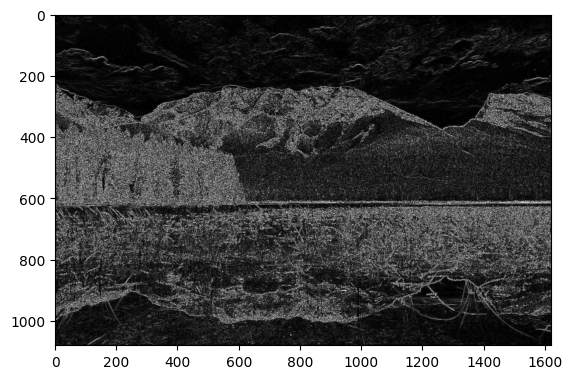

In [45]:
plt.imshow(cv2.cvtColor(sobel_vertical, cv2.COLOR_BGR2RGB))

Фильтр Лапласа

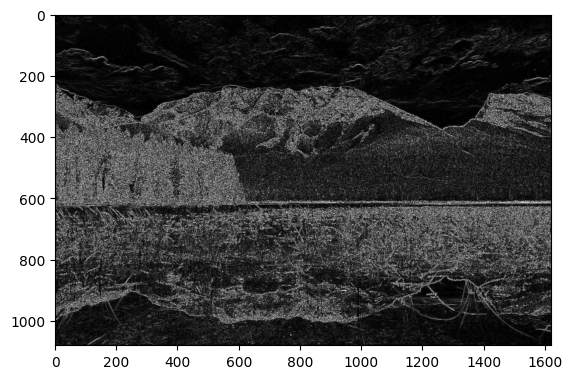

In [46]:
laplx64f_1 = cv2.Laplacian(gray_fig, cv2.CV_64F)
abs_lapl64f_1 = np.absolute(laplx64f_1)
laplacian = np.uint8(abs_sobel64f_1)

plt.imshow(cv2.cvtColor(laplacian, cv2.COLOR_BGR2RGB))

Детектор границ Канни

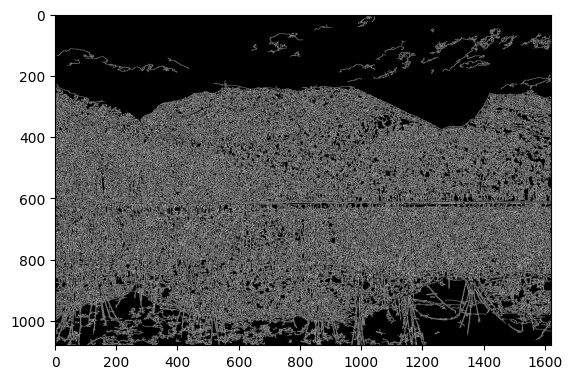

In [47]:
canny = cv2.Canny(gray_fig, 20, 150)
plt.imshow(cv2.cvtColor(canny, cv2.COLOR_BGR2RGB))

# Задание №4

Выбрать затемненное или засвеченное изображение, применить к нему контрастирование гистограммы. 

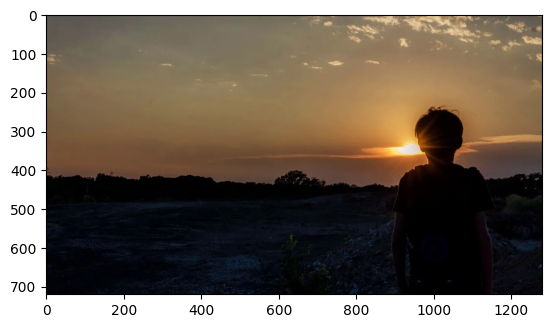

In [48]:
dark = cv2.imread('dark.jpg')
plt.imshow(cv2.cvtColor(dark, cv2.COLOR_BGR2RGB))

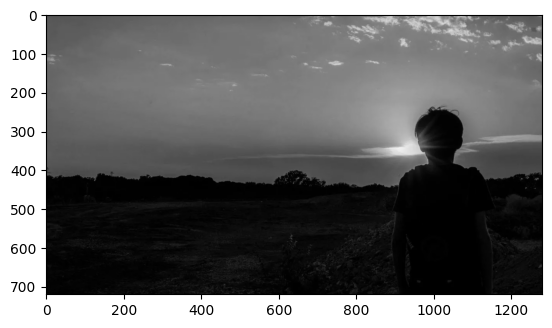

In [49]:
# Преобразование в grayscale
darkGray = cv2.cvtColor(dark, cv2.COLOR_BGR2GRAY)
plt.imshow(cv2.cvtColor(darkGray, cv2.COLOR_BGR2RGB))

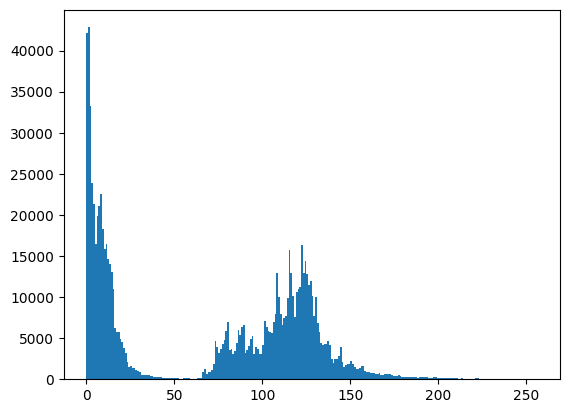

In [50]:
plt.hist(darkGray.ravel(),256,[0,256]); plt.show()

In [51]:
# Текущие минимальная и максимальная интенсивности
x_min = darkGray.min()
x_max = darkGray.max()
print(f'x_min = {x_min}, x_max = {x_max}')

# Новые минимум и максимум
y_min = 100
y_max = y_min + 50
print(f'y_min = {y_min}, y_max = {y_max}')

x_min = 0, x_max = 242
y_min = 100, y_max = 150


$\begin{cases} y_{мин} = ax_{мин} + b, \\ y_{макс} = ax_{макс} + b \end{cases} \Rightarrow y = \frac{x - x_{мин}}{x_{макс} - x_{мин}}(y_{макс} - y_{мин}) + y_{мин}$

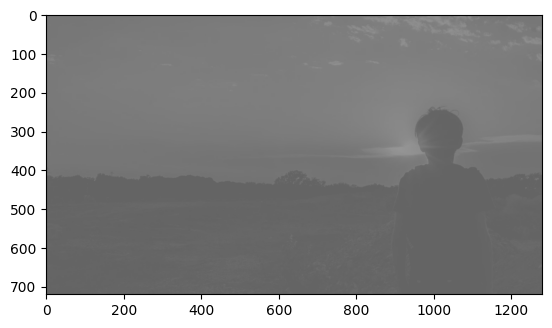

In [52]:
contrasted_img = cv2.add(cv2.multiply(cv2.subtract(darkGray, int(x_min)), (y_max - y_min) / (x_max - x_min)), int(y_min))
plt.imshow(cv2.cvtColor(contrasted_img, cv2.COLOR_BGR2RGB))

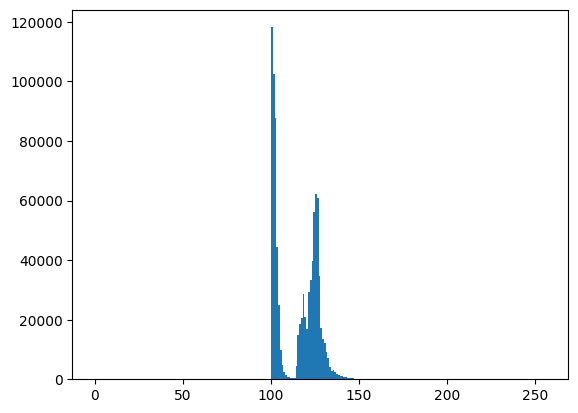

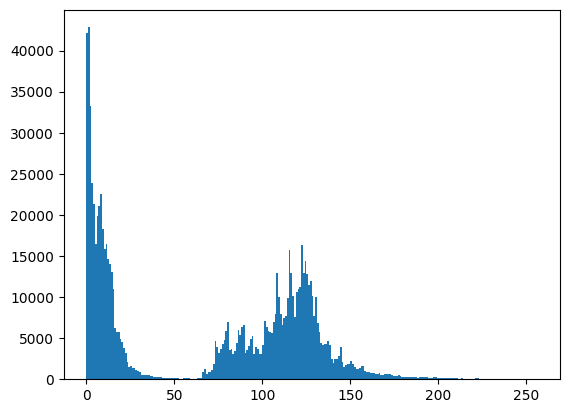

In [53]:
plt.hist(contrasted_img.ravel(),256,[0,256]); plt.show()
plt.hist(darkGray.ravel(),256,[0,256]); plt.show()

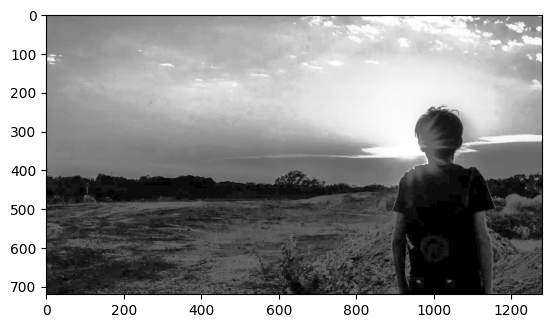

In [54]:
equ = cv2.equalizeHist(darkGray)
plt.imshow(cv2.cvtColor(equ, cv2.COLOR_BGR2RGB))

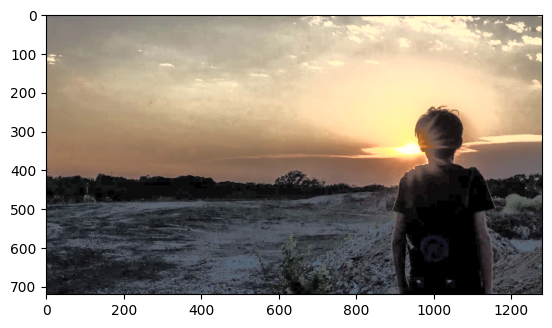

In [55]:
img_yuv = cv2.cvtColor(dark, cv2.COLOR_BGR2YUV)
img_yuv[:,:,0] = cv2.equalizeHist(img_yuv[:,:,0])
img_output = cv2.cvtColor(img_yuv, cv2.COLOR_YUV2BGR)
plt.imshow(cv2.cvtColor(img_output, cv2.COLOR_BGR2RGB))

# Задание №5

Используя выбранные вами изображения (не менее 3-х), продемонстрировать результаты применения эрозии, дилатации, открытия, закрытия, морфологического градиента, преобразования tophat и blackhat.

In [56]:
def output_imgs (img1, img2, img3):
    plt.figure(figsize=(20, 5))
    plt.subplot(131)
    plt.imshow(cv2.cvtColor(img1, cv2.COLOR_BGR2RGB))
    plt.title('img1')
    plt.subplot(132)
    plt.imshow(cv2.cvtColor(img2, cv2.COLOR_BGR2RGB))
    plt.title('img2')
    plt.subplot(133)
    plt.imshow(cv2.cvtColor(img3, cv2.COLOR_BGR2RGB))
    plt.title('img3')
    plt.show()

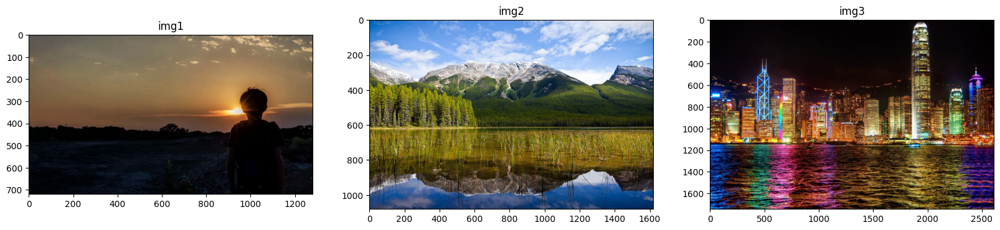

In [57]:
img1 = cv2.imread('dark.jpg')
img2 = cv2.imread('img.jpg')
img3 = cv2.imread('city.jpg')
output_imgs(img1, img2, img3)

In [ ]:
ret,img1 = cv2.threshold(cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY), 127, 255, cv2.THRESH_BINARY_INV)
ret,img2 = cv2.threshold(cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY), 127, 255, cv2.THRESH_BINARY_INV)
ret,img3 = cv2.threshold(cv2.cvtColor(img3, cv2.COLOR_BGR2GRAY), 127, 255, cv2.THRESH_BINARY_INV)

output_imgs(img1, img2, img3)

## Эрозия

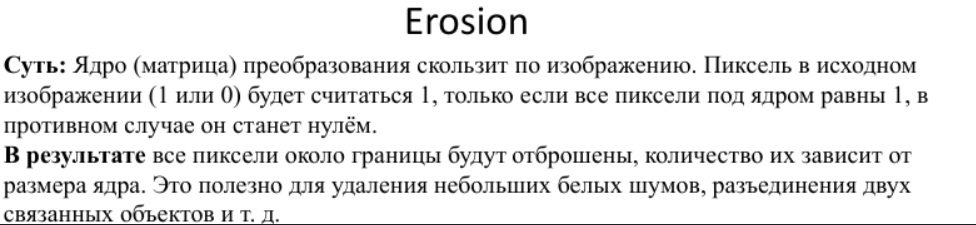

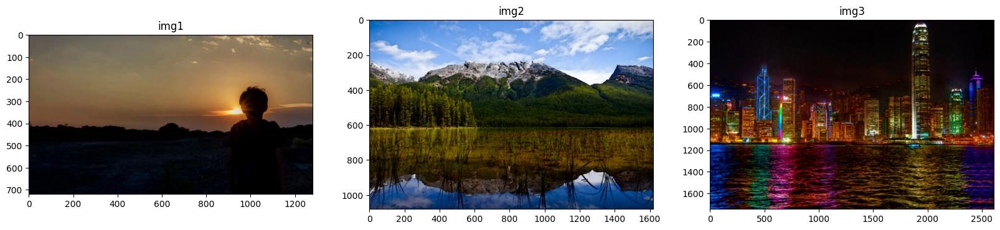

In [59]:
kernel = np.ones((5,5), np.uint8)
erosion1 = cv2.erode(img1, kernel, iterations = 1)
erosion2 = cv2.erode(img2, kernel, iterations = 1)
erosion3 = cv2.erode(img3, kernel, iterations = 1)

output_imgs(erosion1, erosion2, erosion3)

## Дилатация

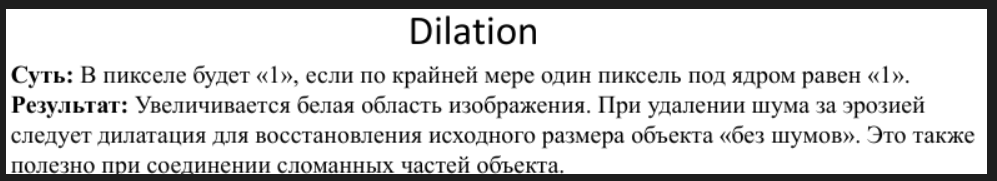

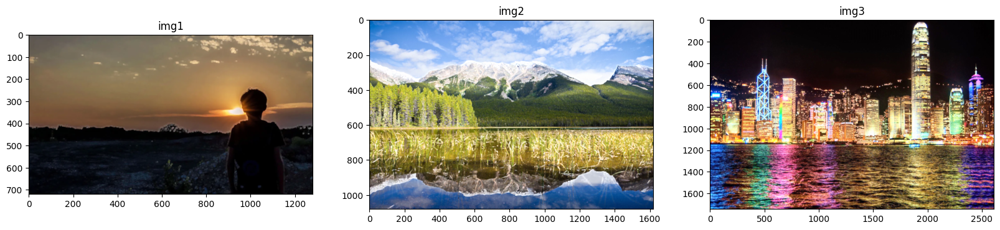

In [60]:
dilation1 = cv2.dilate(img1, kernel, iterations = 1)
dilation2 = cv2.dilate(img2, kernel, iterations = 1)
dilation3 = cv2.dilate(img3, kernel, iterations = 1)

output_imgs(dilation1, dilation2, dilation3)

## Открытие

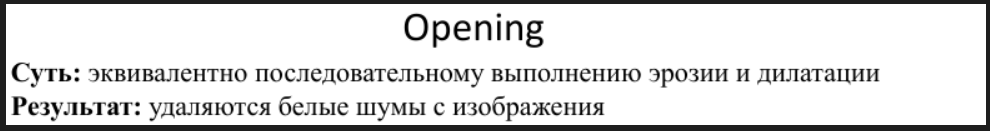

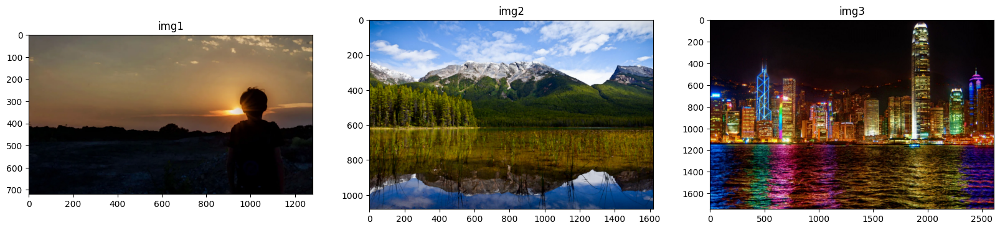

In [61]:
opening1 = cv2.morphologyEx(img1, cv2.MORPH_OPEN, kernel)
opening2 = cv2.morphologyEx(img2, cv2.MORPH_OPEN, kernel)
opening3 = cv2.morphologyEx(img3, cv2.MORPH_OPEN, kernel)

output_imgs(opening1, opening2, opening3)

## Закрытие

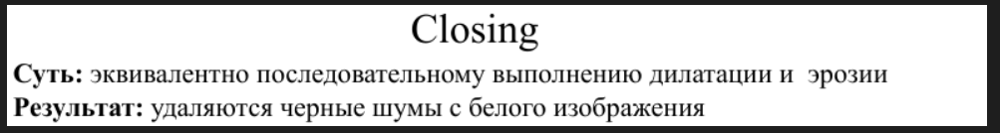

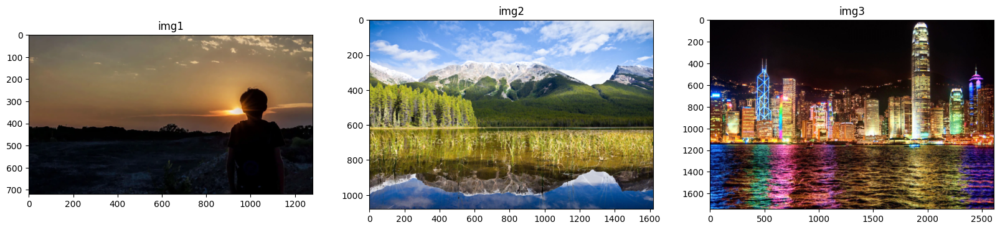

In [62]:
closing1 = cv2.morphologyEx(img1, cv2.MORPH_CLOSE, kernel)
closing2 = cv2.morphologyEx(img2, cv2.MORPH_CLOSE, kernel)
closing3 = cv2.morphologyEx(img3, cv2.MORPH_CLOSE, kernel)

output_imgs(closing1, closing2, closing3)

## Морфологический градиент

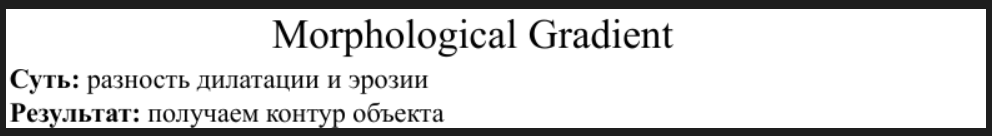

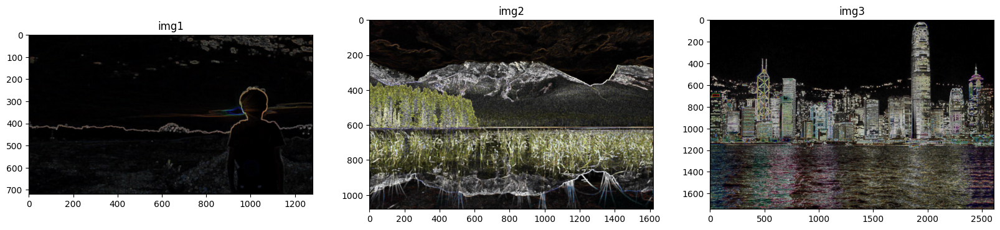

In [63]:
gradient1 = cv2.morphologyEx(img1, cv2.MORPH_GRADIENT, kernel)
gradient2 = cv2.morphologyEx(img2, cv2.MORPH_GRADIENT, kernel)
gradient3 = cv2.morphologyEx(img3, cv2.MORPH_GRADIENT, kernel)


output_imgs(gradient1, gradient2, gradient3)

## Top Hat
Используется для выделения ярких объектов на темном фоне.

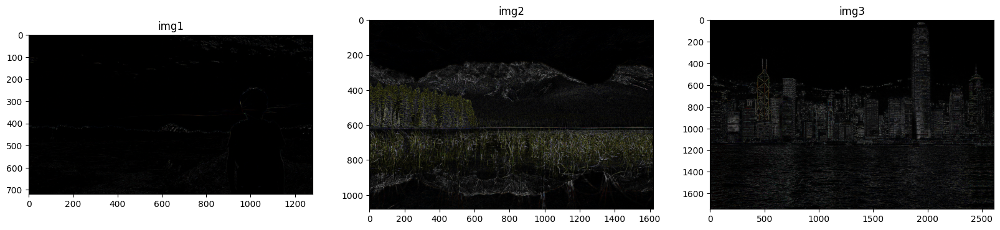

In [64]:
noimg1 = cv2.morphologyEx(img1, cv2.MORPH_TOPHAT, kernel)
noimg2 = cv2.morphologyEx(img2, cv2.MORPH_TOPHAT, kernel)
noimg3 = cv2.morphologyEx(img3, cv2.MORPH_TOPHAT, kernel)
output_imgs(noimg1, noimg2, noimg3)

## Black Hat
Применяется для усиления темных объектов на ярком фоне.

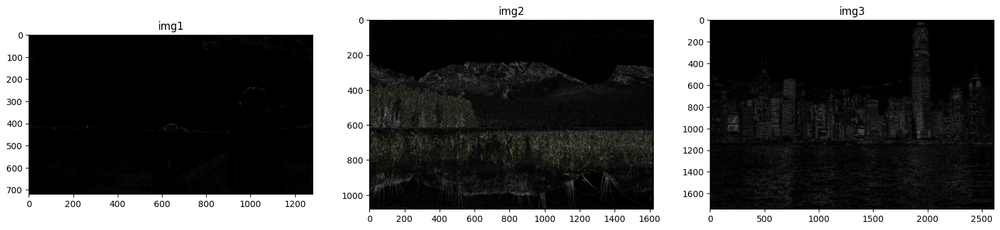

In [65]:
noimg1 = cv2.morphologyEx(img1, cv2.MORPH_BLACKHAT, kernel)
noimg2 = cv2.morphologyEx(img2, cv2.MORPH_BLACKHAT, kernel)
noimg3 = cv2.morphologyEx(img3, cv2.MORPH_BLACKHAT, kernel)
output_imgs(noimg1, noimg2, noimg3)